# <font color=#3A86FF>Données nutritionnelles - Nettoyage </font>

## Sommaire

* [Chargement des donnees](#Chargement-des-donnees)
* [Etude du jeu de donnees](#Etude-du-jeu-de-donnees)
* [Valeurs manquantes](#Valeurs-manquantes)
    * [Pourcentage valeurs manquantes](#Pourcentage-valeurs-manquantes)
    * [Histogramme taux valeurs manquantes](#Histogramme-taux-valeurs-manquantes)
    * [Donnees avec moins de 80% de NA](#Donnees-avec-moins-de-80%-de-valeurs-manquantes)
* [Filtrage des variables qualitatives ayant peu de valeurs uniques
](#Filtrage-des-variables-qualitatives-ayant-peu-de-valeurs-uniques
)
* [Variables quantitatives](#Variables-quantitatives)
    * [Diagrammes boxplot](#Diagrammes-boxplot)
    * [Traitement des outliers](#Traitement-des-outliers)    
    * [Diagrammes pairplot](#Diagrammes-pairplot)
    * [Heatmap](#Heatmap)
    * [Regression lineaire](#Regression-lineaire)
        * [Scores](#Scores)
        * [Prediction](#Prediction)
        * [Imputation des valeurs](#Imputation-des-valeurs)        
* [Variables qualitatives](#Variables-qualitatives)
    * [Tableau de contingence](#Tableau-de-contingence)   
    * [Diagrammes à barres](#Diagrammes-a-barres)
* [Bilan du nettoyage](#Bilan-du-nettoyage)
* [Ecriture fichier CSV](#Ecriture-fichier-CSV)

## <font color=#FB5607>Chargement des donnees</font>

In [4]:
import pandas as pd
import time

now = time.time()
df = pd.read_csv("../Dataset/fr.openfoodfacts.org.products.csv", encoding="utf-8",sep="\t", low_memory=False)

## <font color=#FB5607>Etude du jeu de donnees</font>

Obtenons un aperçu sur un échantillon (8 lignes) de données :

In [5]:
df.sample(10)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
88957,0075450083378,http://world-fr.openfoodfacts.org/produit/0075...,usda-ndb-import,1489135808,2017-03-10T08:50:08Z,1489135808,2017-03-10T08:50:08Z,Natural Sliced Almonds,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
307002,8410261641416,http://world-fr.openfoodfacts.org/produit/8410...,openfoodfacts-contributors,1487608969,2017-02-20T16:42:49Z,1487608973,2017-02-20T16:42:53Z,Simon life naranja,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
316382,8801062322749,http://world-fr.openfoodfacts.org/produit/8801...,date-limite-app,1437785418,2015-07-25T00:50:18Z,1461433277,2016-04-23T17:41:17Z,乐天阿尔法木糖醇口香糖芦荟味86克,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
275097,5099303000683,http://world-fr.openfoodfacts.org/produit/5099...,tulipe,1435424477,2015-06-27T17:01:17Z,1471551904,2016-08-18T20:25:04Z,Luxury fruit cake with irish whiskey,cake aux fruits avec whiskey irlandais,400 g,...,NaN,42.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54410,0042222850452,http://world-fr.openfoodfacts.org/produit/0042...,usda-ndb-import,1489071069,2017-03-09T14:51:09Z,1489071069,2017-03-09T14:51:09Z,Oven Browned Turkey Breast,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,4.0,4.0,NaN,NaN
75171,0071169820747,http://world-fr.openfoodfacts.org/produit/0071...,usda-ndb-import,1489069893,2017-03-09T14:31:33Z,1489069893,2017-03-09T14:31:33Z,Hearts And Lips Sprinkles,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
90002,0075500300011,http://world-fr.openfoodfacts.org/produit/0075...,stephane,1442316869,2015-09-15T11:34:29Z,1442316890,2015-09-15T11:34:50Z,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
58255,0046567027197,http://world-fr.openfoodfacts.org/produit/0046...,usda-ndb-import,1489094649,2017-03-09T21:24:09Z,1489094649,2017-03-09T21:24:09Z,Tomato Paste,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-4.0,-4.0,NaN,NaN
80003,0072273454200,http://world-fr.openfoodfacts.org/produit/0072...,usda-ndb-import,1489068701,2017-03-09T14:11:41Z,1489068702,2017-03-09T14:11:42Z,"Baked Beans, Applewood Baked Bacon",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,-1.0,NaN,NaN
312809,8614111223016,http://world-fr.openfoodfacts.org/produit/8614...,openfoodfacts-contributors,1439983570,2015-08-19T11:26:10Z,1447097595,2015-11-09T19:33:15Z,Dark with almonds,NaN,400 g,...,NaN,NaN,NaN,61.6,NaN,NaN,22.0,22.0,NaN,NaN


Quelle taille fait le jeu de données?

In [7]:
print(f"{df.shape} (lignes,col) - taille: {df.size} (nb elements)")

(320772, 162) (lignes,col) - taille: 51965064 (nb elements)


In [8]:
df

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,0000000016094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320767,9948282780603,http://world-fr.openfoodfacts.org/produit/9948...,openfoodfacts-contributors,1490631299,2017-03-27T16:14:59Z,1491244498,2017-04-03T18:34:58Z,Tomato & ricotta,NaN,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320768,99567453,http://world-fr.openfoodfacts.org/produit/9956...,usda-ndb-import,1489059076,2017-03-09T11:31:16Z,1491244499,2017-04-03T18:34:59Z,"Mint Melange Tea A Blend Of Peppermint, Lemon ...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
320769,9970229501521,http://world-fr.openfoodfacts.org/produit/9970...,tomato,1422099377,2015-01-24T11:36:17Z,1491244499,2017-04-03T18:34:59Z,乐吧泡菜味薯片,Leba pickle flavor potato chips,50 g,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320770,9980282863788,http://world-fr.openfoodfacts.org/produit/9980...,openfoodfacts-contributors,1492340089,2017-04-16T10:54:49Z,1492340089,2017-04-16T10:54:49Z,Tomates aux Vermicelles,NaN,67g,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


*Voyons quelles sont les 162 colonnes et leur type?*

In [9]:
pd.set_option('display.max_rows', 162)
df.dtypes.head(10)

code                      object
url                       object
creator                   object
created_t                 object
created_datetime          object
last_modified_t           object
last_modified_datetime    object
product_name              object
generic_name              object
quantity                  object
dtype: object

## <font color=#FB5607>Valeurs manquantes</font>

A présent, voyons combien de valeurs manquantes il y a par variable

In [10]:
# df.isna().sum() est de type Series
sCountNA=df.isna().sum()
sCountNA.head(10)

code                          23
url                           23
creator                        2
created_t                      3
created_datetime               9
last_modified_t                0
last_modified_datetime         0
product_name               17762
generic_name              267977
quantity                  215953
dtype: int64

Pour determiner les variables qui ont "trop" de valeurs manquantes, calculons le taux de ces valeurs

### Pourcentage valeurs manquantes

In [11]:
import numpy as np
# nombre de ligne par variables : 320772
rowCount=len(df['water-hardness_100g']) 

# pourcentage de valeurs non vides par variable + tri par ordre decroissant
pctNA=(sCountNA/rowCount*100).sort_values(ascending=False)
pctNA=pctNA.astype('int') # conversion int

Nous avons calculé le pourcentage de valeurs manquantes mais aussi trié par taux décroissant\
pour identifier toutes les variables avec plus de 80% de valeurs manquantes

In [12]:
pctNA.head(10)

water-hardness_100g                      100
no_nutriments                            100
ingredients_that_may_be_from_palm_oil    100
nutrition_grade_uk                       100
nervonic-acid_100g                       100
erucic-acid_100g                         100
mead-acid_100g                           100
elaidic-acid_100g                        100
butyric-acid_100g                        100
caproic-acid_100g                        100
dtype: int64

Determinons la position de la variable qui correspond au seuil de 81%.\
Cette position permet de séparer les variable qui ont plus (ou moins) de 80% de valeurs manquantes.

In [13]:
# index de la limite à 80% de valeurs manquantes (NA)
limitCountNA=pctNA.index.get_loc(pctNA[pctNA==81].index.values[0])
limitCountNA

107

### Histogramme taux valeurs manquantes

On estime qu'au dessus d'un seuil de 80% de valeurs manquantes, le jeu de données n'est plus représentatif.

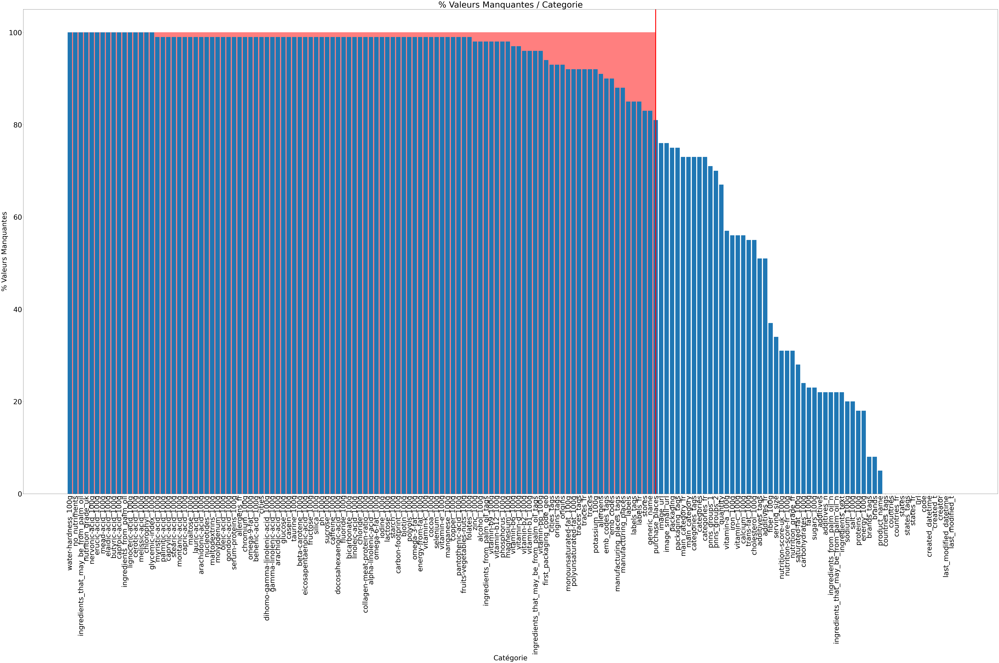

In [14]:
from matplotlib import pyplot as plt
# reset defaults
plt.rcdefaults()

# taille du graphique
plt.rcParams['font.size'] = '40.0'
plt.rcParams["figure.figsize"] = (100,50)
# bar chart
plt.bar(pctNA.index,pctNA)
# ligne limite des 80% de valeurs manquantes
plt.axvline(limitCountNA, color='r',lw=5)
plt.fill_betweenx(pctNA,limitCountNA,color="red",alpha=.5)

# rotation à la verticale des libelles
plt.xticks(rotation=90)

# Titre et libelles
plt.title('% Valeurs Manquantes / Categorie')
plt.xlabel('Catégorie')
plt.ylabel('% Valeurs Manquantes')

plt.show()

Les données dans la zone rouge (à  gauche) sont toutes les données dont le taux de valeurs manquantes est supérieur à 80%.\
Ces données sont donc écartées de notre étude.

### Donnees avec moins de 80% de valeurs manquantes

On ne garde donc que les colonnes ayant moins de 80% de valeurs manquantes

In [15]:
# identification des colonnes avec taux de valeurs manquantes < 81%
colonnesNA80=pctNA[pctNA<81]
colonnesNA80.index

Index(['image_url', 'image_small_url', 'packaging', 'packaging_tags',
       'main_category_fr', 'main_category', 'categories_tags', 'categories',
       'categories_fr', 'pnns_groups_1', 'pnns_groups_2', 'quantity',
       'vitamin-a_100g', 'iron_100g', 'vitamin-c_100g', 'calcium_100g',
       'trans-fat_100g', 'cholesterol_100g', 'additives_tags', 'additives_fr',
       'fiber_100g', 'serving_size', 'nutrition-score-uk_100g',
       'nutrition-score-fr_100g', 'nutrition_grade_fr', 'saturated-fat_100g',
       'carbohydrates_100g', 'fat_100g', 'sugars_100g', 'additives',
       'additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'ingredients_text',
       'sodium_100g', 'salt_100g', 'proteins_100g', 'energy_100g',
       'brands_tags', 'brands', 'product_name', 'countries_tags', 'countries',
       'countries_fr', 'states', 'states_tags', 'states_fr', 'url', 'code',
       'created_datetime', 'created_t', 'creator', 'last_modified_datetime',

In [16]:
# filtrage
dfNA80=df[colonnesNA80.index]
dfNA80.head()

,image_url,image_small_url,packaging,packaging_tags,main_category_fr,main_category,categories_tags,categories,categories_fr,pnns_groups_1,...,states,states_tags,states_fr,url,code,created_datetime,created_t,creator,last_modified_datetime,last_modified_t
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",http://world-fr.openfoodfacts.org/produit/0000...,0000000003087,2016-09-17T09:17:46Z,1474103866,openfoodfacts-contributors,2016-09-17T09:18:13Z,1474103893
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",http://world-fr.openfoodfacts.org/produit/0000...,0000000004530,2017-03-09T14:32:37Z,1489069957,usda-ndb-import,2017-03-09T14:32:37Z,1489069957
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",http://world-fr.openfoodfacts.org/produit/0000...,0000000004559,2017-03-09T14:32:37Z,1489069957,usda-ndb-import,2017-03-09T14:32:37Z,1489069957
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",http://world-fr.openfoodfacts.org/produit/0000...,0000000016087,2017-03-09T10:35:31Z,1489055731,usda-ndb-import,2017-03-09T10:35:31Z,1489055731
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",http://world-fr.openfoodfacts.org/produit/0000...,0000000016094,2017-03-09T10:34:13Z,1489055653,usda-ndb-import,2017-03-09T10:34:13Z,1489055653


## <font color=#FB5607>Filtrage des variables qualitatives ayant peu de valeurs uniques</font>

In [17]:
# identification des colonnes numériques et qualitatives
colonnesNum=dfNA80.select_dtypes(np.number).columns.tolist()
colonnesQual=dfNA80.select_dtypes('O').columns.tolist()

In [18]:
# filtrage des données qualitative + tri des colonnes par nombre de valeurs uniques
dfNA80ObjSorted=(dfNA80.describe(include='O')).sort_values(by='unique',axis=1,ascending=True)

# identification des colonnes qualitatives comportant peu de valeurs uniques (beaucoup de doublons)
dfNA80ObjUniq=dfNA80ObjSorted.loc[dfNA80ObjSorted.index=='unique']
dfNA80ObjUniq

,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,countries_fr,countries_tags,states_fr,states,states_tags,countries,creator,...,image_url,last_modified_t,last_modified_datetime,created_t,created_datetime,additives,ingredients_text,product_name,url,code
unique,5,14,42,722,725,1021,1021,1021,1434,3535,...,75836,180495,180495,189567,189568,196069,205520,221347,320749,320749


In [19]:
# voyons les variables nutrition_grade_fr, pnns_groups-1, et pnns!groups-2
dfNA80['nutrition_grade_fr'].value_counts()

d    62763
c    45538
e    43030
a    35634
b    34245
Name: nutrition_grade_fr, dtype: int64

On conservera cette variable qui donne des indications importantes sur la qualité nutritionnelle

In [20]:
dfNA80['pnns_groups_1'].value_counts()

unknown                    22624
Sugary snacks              12368
Beverages                   9033
Milk and dairy products     8825
Cereals and potatoes        8442
Fish Meat Eggs              8041
Composite foods             6747
Fruits and vegetables       5908
Fat and sauces              5216
Salty snacks                2809
fruits-and-vegetables        987
sugary-snacks                496
cereals-and-potatoes          16
salty-snacks                   1
Name: pnns_groups_1, dtype: int64

In [21]:
dfNA80['pnns_groups_2'].value_counts()

unknown                             22624
One-dish meals                       5546
Sweets                               4698
Biscuits and cakes                   4561
Non-sugared beverages                4302
Cereals                              4106
Cheese                               4024
Dressings and sauces                 3602
Milk and yogurt                      3297
Processed meat                       3247
Chocolate products                   3109
Alcoholic beverages                  2909
Vegetables                           2840
Fish and seafood                     2638
Sweetened beverages                  2170
Appetizers                           2101
Fruits                               2068
Fruit juices                         1924
Bread                                1838
Meat                                 1694
Fats                                 1614
Breakfast cereals                    1408
vegetables                            934
Legumes                           

On exclue les données qualitatives avec très peu de valeurs uniques (pnns_groups_1,pnns_groups_2)

In [22]:
# colonnes qualitatives sans les colonnes contenant beaucoup de doublons
colonnesQual=list(set(colonnesQual)-set(['pnns_groups_1','pnns_groups_2']))

## <font color=#FB5607>Variables quantitatives</font>

In [23]:
dfNum=dfNA80[colonnesNum]
dfNum.describe()

,vitamin-a_100g,iron_100g,vitamin-c_100g,calcium_100g,trans-fat_100g,cholesterol_100g,fiber_100g,nutrition-score-uk_100g,nutrition-score-fr_100g,saturated-fat_100g,carbohydrates_100g,fat_100g,sugars_100g,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,sodium_100g,salt_100g,proteins_100g,energy_100g
count,137554.000000,140462.000000,140867.000000,141050.000000,143298.000000,144090.000000,200886.000000,221210.000000,221210.000000,229554.000000,243588.000000,243891.000000,244971.000000,248939.000000,248939.000000,248939.000000,255463.000000,255510.000000,259922.000000,2.611130e+05
mean,0.000397,0.003652,0.023367,0.125163,0.073476,0.020071,2.862111,9.058049,9.165535,5.129932,32.073981,12.730379,16.003484,1.936024,0.019659,0.055246,0.798815,2.028624,7.075940,1.141915e+03
std,0.073278,0.214408,2.236451,3.318263,1.540223,0.358062,12.867578,9.183589,9.055903,8.014238,29.731719,17.578747,22.327284,2.502019,0.140524,0.269207,50.504428,128.269454,8.409054,6.447154e+03
min,-0.000340,-0.000260,-0.002100,0.000000,-3.570000,0.000000,-6.700000,-15.000000,-15.000000,0.000000,0.000000,0.000000,-17.860000,0.000000,0.000000,0.000000,0.000000,0.000000,-800.000000,0.000000e+00
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,6.000000,0.000000,1.300000,0.000000,0.000000,0.000000,0.025000,0.063500,0.700000,3.770000e+02
50%,0.000000,0.001010,0.000000,0.035000,0.000000,0.000000,1.500000,9.000000,10.000000,1.790000,20.600000,5.000000,5.710000,1.000000,0.000000,0.000000,0.229000,0.581660,4.760000,1.100000e+03
75%,0.000107,0.002400,0.003700,0.106000,0.000000,0.020000,3.600000,16.000000,16.000000,7.140000,58.330000,20.000000,24.000000,3.000000,0.000000,0.000000,0.541000,1.374140,10.000000,1.674000e+03
max,26.700000,50.000000,716.981100,694.737000,369.000000,95.238000,5380.000000,40.000000,40.000000,550.000000,2916.670000,714.290000,3520.000000,31.000000,2.000000,6.000000,25320.000000,64312.800000,430.000000,3.251373e+06


### Diagrammes boxplot

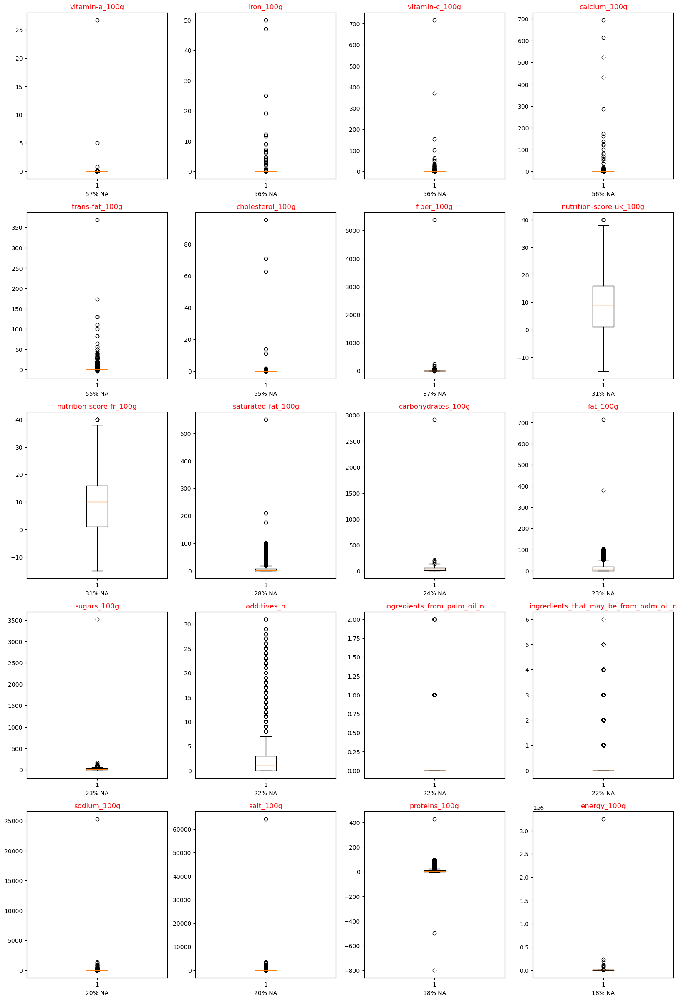

In [24]:
plt.rcdefaults()
plt.rcParams["figure.figsize"] = (100,40)

fig, axes = plt.subplots(nrows=5, ncols=4,figsize=(20,30))
axes=axes.flatten()

i=0
for x in dfNum.columns:
        #print(x) #debug
        # on dessine le boxplot en excluant les valeurs manquantes pour chaque variable quantitative
        axes[i].boxplot(dfNum[x].dropna())
        axes[i].set_title(x,color='red')
        axes[i].set_xlabel(str(colonnesNA80[x])+'% NA')
        i+=1

### Traitement des outliers

On remarque des valeurs atypiques pour les variables "energy_100g" et "proteins_100g"\
On écarte ces valeurs atypiques pour voir si le boxplot est plus lisible

In [25]:
#%%writefile helpers.py
# fonction qui retourne le mask qui retourne les lignes d'une Serie, correspondant aux outliers
def maskOutliers(s):
    """
    Fonction qui retourne le mask qui retourne les lignes d'une Serie, correspondant aux outliers

    Parameters
    ----------
    s : pandas Series
        une Serie de valeurs numériques

    Returns
    -------
    mask : Series
        une Serie de booleens correspondant au masque qui retourne les valeurs atypiques/Outliers
    """
    # premier Quantile
    Q1 = s.quantile(0.25)
    # 3e quantile
    Q3 = s.quantile(0.75)
    # Interquantile
    IQR = Q3 - Q1
    
    # les outliers sont toutes les valeurs qui sont inférieures à Q1-1.5*IQR et supérieure à  Q3+1.5*IQR
    mask=(s < (Q1 - 1.5 * IQR)) |(s > (Q3 + 1.5 * IQR))
    return mask

In [26]:
# on mets à zero les outliers pour les exclure de l'etude
columnNames=['proteins_100g','energy_100g','salt_100g','sugars_100g','fat_100g','carbohydrates_100g','saturated-fat_100g','fiber_100g','cholesterol_100g','calcium_100g','vitamin-c_100g','vitamin-a_100g','iron_100g']
for name in columnNames:
    mask=maskOutliers(dfNum[name])
    dfNum.loc[mask,name]=0

/Users/hui-guan/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/Users/hui-guan/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:692: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)
/Users/hui-guan/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/

#### Boxplots apres exclusion des outliers

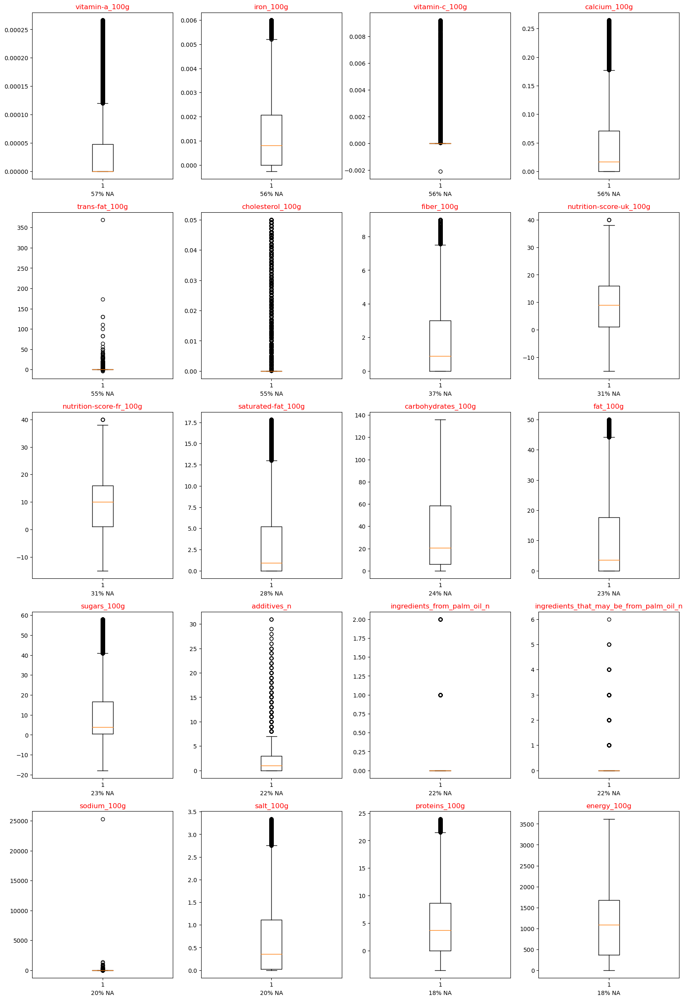

In [27]:
plt.rcdefaults()
plt.rcParams["figure.figsize"] = (100,40)

fig, axes = plt.subplots(nrows=5, ncols=4,figsize=(20,30))
axes=axes.flatten()

i=0
for x in dfNum.columns:
        #print(x) #debug
        # on dessine le boxplot en excluant les valeurs manquantes pour chaque variable quantitative
        axes[i].boxplot(dfNum[x].dropna())
        axes[i].set_title(x,color='red')
        axes[i].set_xlabel(str(colonnesNA80[x])+'% NA')
        i+=1

### Heatmap

In [28]:
# matrice de correlation sur les variables numériques
#dfCorr=dfNum[['nutrition-score-fr_100g','nutrition-score-uk_100g','sodium_100g','salt_100g','energy_100g','fat_100g']].corr()
dfCorr=dfNum.corr()

Pour confirmer/infirmer la relation entre ces couples, voyons les corrélations evéntuelles

In [29]:
# Heatmap de la matrice de correlation (avec precision à 2 decimales)
dfCorr.style.background_gradient(cmap='coolwarm').set_precision(2)

,vitamin-a_100g,iron_100g,vitamin-c_100g,calcium_100g,trans-fat_100g,cholesterol_100g,fiber_100g,nutrition-score-uk_100g,nutrition-score-fr_100g,saturated-fat_100g,carbohydrates_100g,fat_100g,sugars_100g,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,sodium_100g,salt_100g,proteins_100g,energy_100g
vitamin-a_100g,1.00,-0.11,0.17,0.12,-0.01,0.16,-0.09,0.01,0.01,0.13,-0.21,-0.01,-0.02,0.01,0.00,0.07,-0.01,0.05,-0.06,-0.19
iron_100g,-0.11,1.00,-0.03,0.17,0.00,-0.08,0.34,0.00,0.00,0.10,0.30,0.17,0.08,-0.01,0.01,-0.05,-0.01,0.06,0.34,0.37
vitamin-c_100g,0.17,-0.03,1.00,0.03,-0.01,0.01,0.01,-0.16,-0.16,-0.11,-0.15,-0.12,-0.08,-0.06,0.01,-0.01,-0.00,0.02,-0.08,-0.20
calcium_100g,0.12,0.17,0.03,1.00,-0.01,0.20,0.08,-0.02,-0.02,0.11,-0.01,0.08,0.08,0.06,0.02,0.03,-0.02,-0.06,0.16,0.05
trans-fat_100g,-0.01,0.00,-0.01,-0.01,1.00,0.00,-0.01,0.02,0.02,0.02,0.01,0.02,0.01,0.01,0.01,0.01,-0.00,0.01,-0.00,0.02
cholesterol_100g,0.16,-0.08,0.01,0.20,0.00,1.00,-0.13,0.11,0.11,0.18,-0.09,0.07,0.09,0.14,-0.00,0.10,-0.01,0.07,0.09,-0.04
fiber_100g,-0.09,0.34,0.01,0.08,-0.01,-0.13,1.00,-0.10,-0.11,0.04,0.29,0.13,0.12,-0.09,0.06,-0.00,-0.01,0.01,0.14,0.27
nutrition-score-uk_100g,0.01,0.00,-0.16,-0.02,0.02,0.11,-0.10,1.00,0.99,0.58,0.26,0.62,0.44,0.16,0.12,0.06,0.01,0.28,0.02,0.65
nutrition-score-fr_100g,0.01,0.00,-0.16,-0.02,0.02,0.11,-0.11,0.99,1.00,0.56,0.26,0.61,0.45,0.17,0.12,0.06,0.01,0.26,-0.00,0.63
saturated-fat_100g,0.13,0.10,-0.11,0.11,0.02,0.18,0.04,0.58,0.56,1.00,0.02,0.49,0.21,0.07,0.12,0.08,-0.00,0.11,0.14,0.44


La matrice de correlation montre l'équivalence entre "nutrition-score-uk_100g" / "nutrition-score-fr_100g" et "salt_100g" / "sodium_100g"
=> on exclue les variables "nutrition-score-uk_100g" et "sodium_100g"\
=> on regenere la heatmap pour voir le résultat nettoyage

In [26]:
import copy
colonnesNum2=copy.deepcopy(colonnesNum)
colonnesNum2.remove("nutrition-score-uk_100g")
colonnesNum2.remove("sodium_100g")
dfNum2=dfNum[colonnesNum2]
dfCorr2=dfNum2.corr()
dfCorr2.style.background_gradient(cmap='coolwarm').set_precision(2)

,vitamin-a_100g,iron_100g,vitamin-c_100g,calcium_100g,trans-fat_100g,cholesterol_100g,fiber_100g,nutrition-score-fr_100g,saturated-fat_100g,carbohydrates_100g,fat_100g,sugars_100g,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,salt_100g,proteins_100g,energy_100g
vitamin-a_100g,1.00,-0.11,0.17,0.12,-0.01,0.16,-0.09,0.01,0.13,-0.21,-0.01,-0.02,0.01,0.00,0.07,0.05,-0.06,-0.19
iron_100g,-0.11,1.00,-0.03,0.17,0.00,-0.08,0.34,0.00,0.10,0.30,0.17,0.08,-0.01,0.01,-0.05,0.06,0.34,0.37
vitamin-c_100g,0.17,-0.03,1.00,0.03,-0.01,0.01,0.01,-0.16,-0.11,-0.15,-0.12,-0.08,-0.06,0.01,-0.01,0.02,-0.08,-0.20
calcium_100g,0.12,0.17,0.03,1.00,-0.01,0.20,0.08,-0.02,0.11,-0.01,0.08,0.08,0.06,0.02,0.03,-0.06,0.16,0.05
trans-fat_100g,-0.01,0.00,-0.01,-0.01,1.00,0.00,-0.01,0.02,0.02,0.01,0.02,0.01,0.01,0.01,0.01,0.01,-0.00,0.02
cholesterol_100g,0.16,-0.08,0.01,0.20,0.00,1.00,-0.13,0.11,0.18,-0.09,0.07,0.09,0.14,-0.00,0.10,0.07,0.09,-0.04
fiber_100g,-0.09,0.34,0.01,0.08,-0.01,-0.13,1.00,-0.11,0.04,0.29,0.13,0.12,-0.09,0.06,-0.00,0.01,0.14,0.27
nutrition-score-fr_100g,0.01,0.00,-0.16,-0.02,0.02,0.11,-0.11,1.00,0.56,0.26,0.61,0.45,0.17,0.12,0.06,0.26,-0.00,0.63
saturated-fat_100g,0.13,0.10,-0.11,0.11,0.02,0.18,0.04,0.56,1.00,0.02,0.49,0.21,0.07,0.12,0.08,0.11,0.14,0.44
carbohydrates_100g,-0.21,0.30,-0.15,-0.01,0.01,-0.09,0.29,0.26,0.02,1.00,0.06,0.41,0.16,0.08,0.02,-0.08,0.04,0.53


Les couples suivants montrent les plus fortes correlation:
1. energy_100g / fat_100g
2. fat_100g / saturated-fat_100g
3. sugars_100g / carbohydrates_100g
4. energy_100g / fiber_100g
5. saturated-fat_100g / nutrition-score-fr_100g

### Diagrammes pairplot

Nous remarquons parmi l'ensemble des variables numériques la variable *nutrition-score-fr_100g*, qui semble noter la qualité de l'aliment.\
Pour la suite, nous étudions les corrélations des variables numériques par rapport à cette variable.

On utilisera les codes couleurs du logo Nutriscore pour anoter nos diagrammes pairplots avec la note nutriscore

<div>
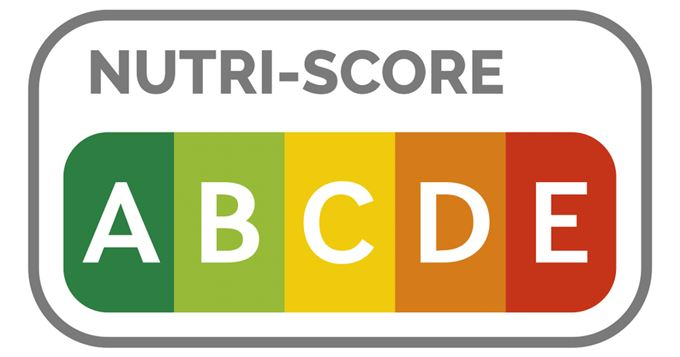
</div>

In [27]:
# preparation de la palette de couleur des pairplots qui reprend les codes couleurs hexa du logo nutriscore
custom_palette = {
'd': '#E08530',#Orange
 'c': '#F6CB45',#Jaune
 'e': '#D44B29',#Rouge
 'a': '#387E47',#Vert foncé
 'b': '#91B849' #Vert   
}
custom_palette

{'d': '#E08530',
 'c': '#F6CB45',
 'e': '#D44B29',
 'a': '#387E47',
 'b': '#91B849'}

In [28]:
# decoupage des variables numeriques en 2 groupes pour faciliter la visualisation des pairplots
chunks=np.array_split(colonnesNum2,2)

# on s'assure que le premier groupe contient bien les variables nutrition_grade_fr et nutrition-score-fr_100g
chunk0=chunks[0].tolist()
chunk0.append("nutrition_grade_fr")  if "nutrition_grade_fr" not in chunk0 else chunk0
chunk0.append("nutrition-score-fr_100g")  if "nutrition-score-fr_100g" not in chunk0 else chunk0

# on s'assure que le deuxième groupe contient bien les variables nutrition_grade_fr et nutrition-score-fr_100g
chunk1=chunks[1].tolist()
chunk1.append("nutrition_grade_fr")  if "nutrition_grade_fr" not in chunk1 else chunk1
chunk1.append("nutrition-score-fr_100g")  if "nutrition-score-fr_100g" not in chunk1 else chunk1

/Users/hui-guan/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/hui-guan/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/hui-guan/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


10.846845865249634

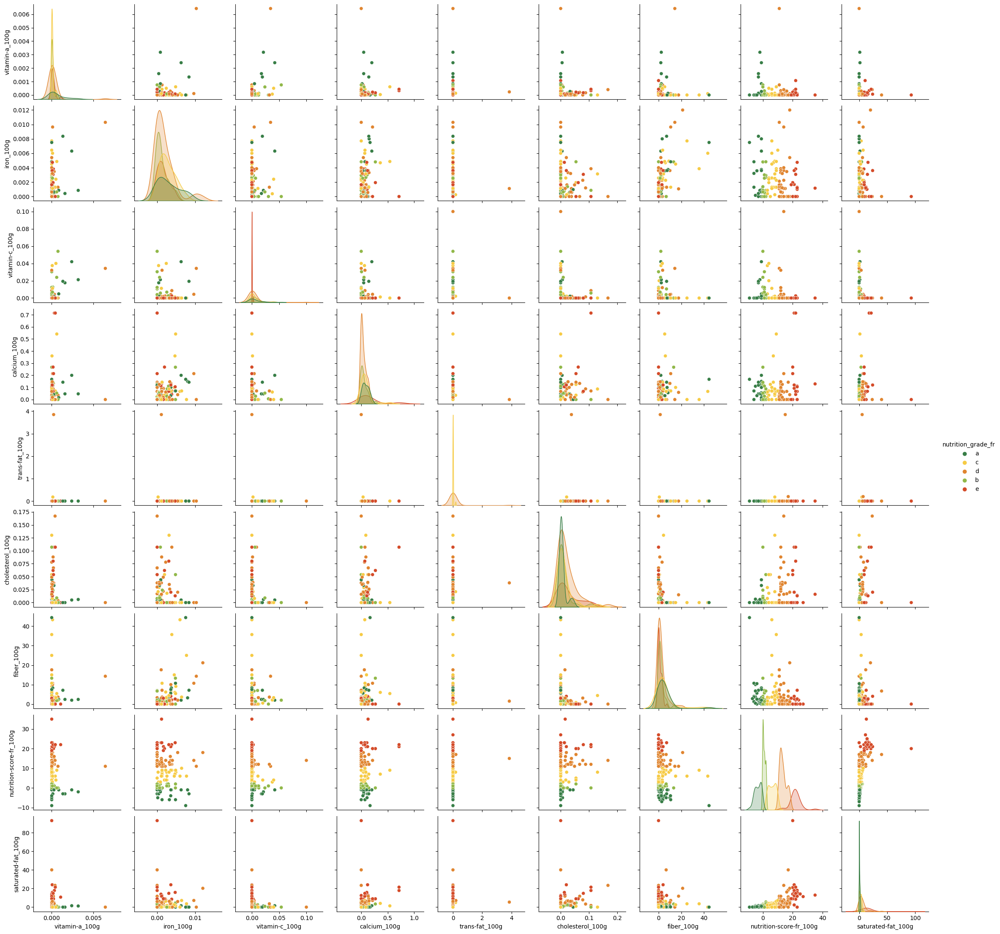

In [29]:
import time
import seaborn as sns
# pour accélerer l'affichage, on calcule les pairplot sur un echantillon de 300
now=time.time()
sns.pairplot(dfNA80[chunk0].sample(300),hue="nutrition_grade_fr",palette=custom_palette)
time.time()-now

/Users/hui-guan/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/hui-guan/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/hui-guan/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/hui-guan/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


13.118673086166382

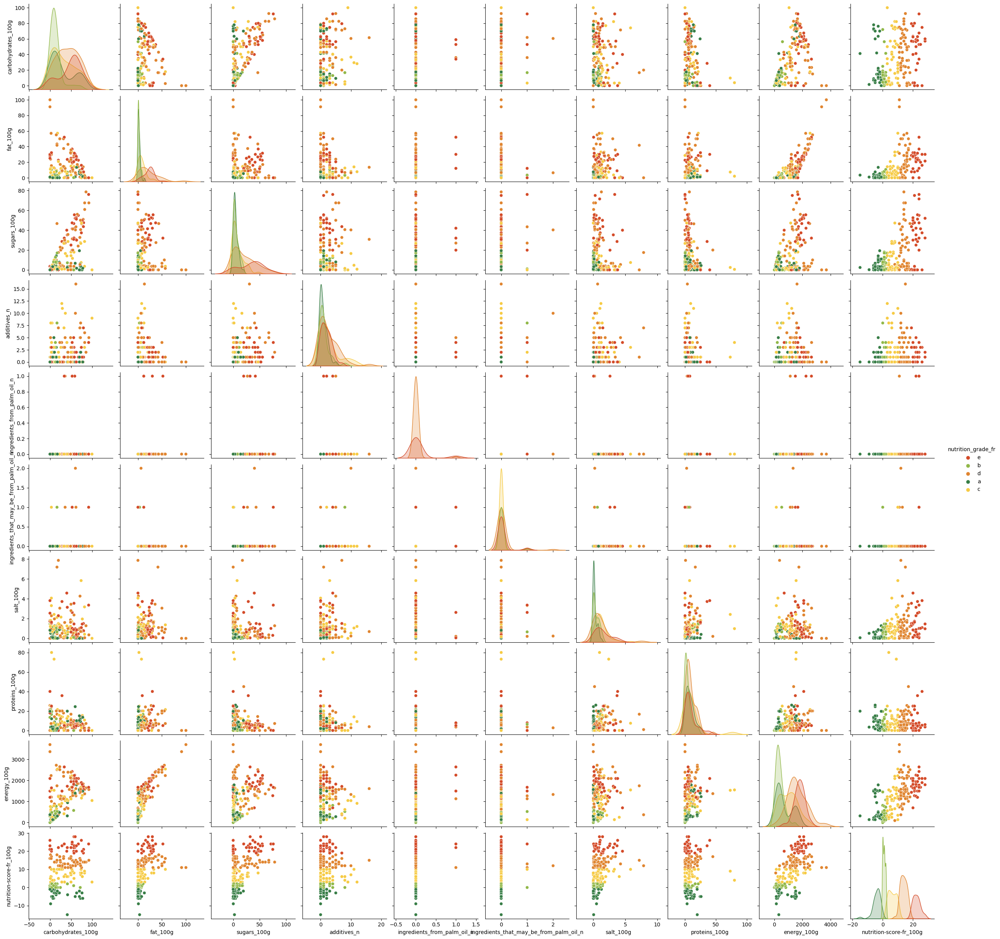

In [30]:
# pour accélerer l'affichage, on calcule les pairplot sur un echantillon de 300
now=time.time()
sns.pairplot(dfNA80[chunk1].sample(300),hue="nutrition_grade_fr",palette=custom_palette)
time.time()-now

En s'appuyant sur la heatmap, vue plus haut, et les pairplots on reconnait les variables qui contribuent tres peu au nutrition-score-fr-100g (qui apportent peu de valeur nutritives): ce sont
celles qui presentent une "ligne" plate en y=0
* ingredients_that_may_be_from_palm_oil_n
* ingredients_from_palm_oil_n
* trans-fat_100g

On les supprime donc de notre liste de variables et relançons un pairplot

In [31]:
import copy
colonnesNum3=copy.deepcopy(colonnesNum2)
colonnesNum3=list(set(colonnesNum3) - set(['ingredients_that_may_be_from_palm_oil_n','ingredients_from_palm_oil_n','trans-fat_100g']))
colonnesNum3.append("nutrition_grade_fr") if "nutrition_grade_fr" not in colonnesNum3 else colonnesNum3
dfNum3=dfNA80[colonnesNum3]

34.45882701873779

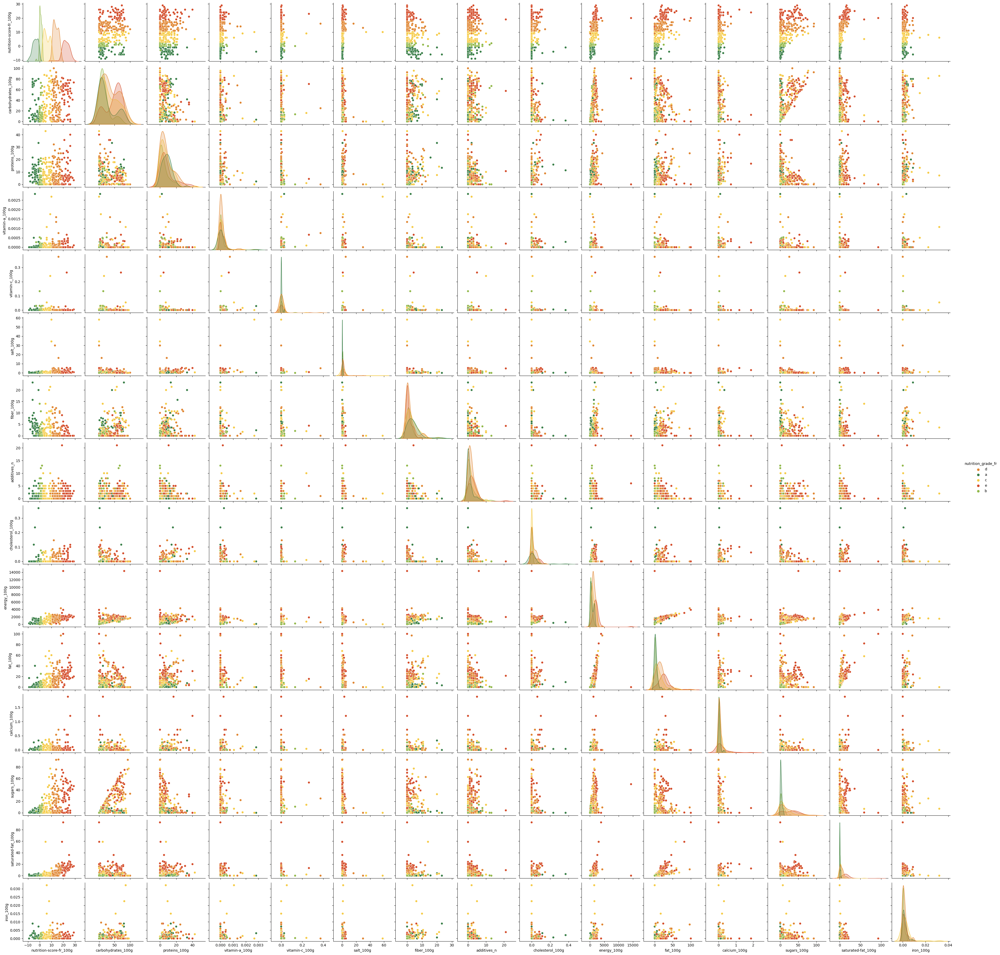

In [32]:
now=time.time()
sns.pairplot(dfNum3.sample(500),hue="nutrition_grade_fr",palette=custom_palette)
time.time()-now

#### Conclusion

A partir de la Heatmap et des pairplots, Les couples suivants montrent les plus fortes correlation:

1. energy_100g / fat_100g
2. fat_100g / saturated-fat_100g
3. sugars_100g / carbohydrates_100g
4. saturated-fat_100g / nutrition-score-fr_100g

Il semblerait que les variables couplées pourraient servir à expliquer/compléter les variables manquantes

On remarque également que les variables suivantes contribuent/influencent le plus fortement la variable nutrition-score_100g

1. energy_100g
2. additives_n
3. proteins_100g
4. fat_100g
5. sugars_100g
6. calcium_100g
7. carbohydrates_100g

### Regression lineaire

A partir de ces variables, on cherche les couples ayant le coefficient de correlation linéaire le plus elevé.\
Pour ensuite faire une imputation des valeurs manquantes par régression linéaire.

#### Scores

In [33]:
from sklearn import linear_model
from sklearn import preprocessing

lm = linear_model.LinearRegression()

# fonction de regression linéaire, prenant la variable à prédire au format Serie (dfY), la variable de prédiction au format Dataframe(dfX), et retourne le modele
def lmModel(sX,sY):
    xName=sX.name
    yName=sY.name

    # Pour entrainer le modele, on utilise un df sur les 2 variables
    # en supprimant toutes les lignes contenant des NA
    df=(sX.to_frame().join(sY)).dropna()
    
    x=df[xName].values.reshape(df.shape[0],-1)
    y=df[yName].values.reshape(df.shape[0],-1)

    # on fit le modele
    lm.fit(x,y)

    return lm

In [34]:
model=lmModel(dfNum3["energy_100g"],dfNum3["fat_100g"])

#R^2 score
model.coef_

array([[0.0002488]])

In [35]:
model=lmModel(dfNum3["fat_100g"],dfNum3["saturated-fat_100g"])

#R^2 score
model.coef_

array([[0.29697937]])

In [36]:
model=lmModel(dfNum3["sugars_100g"],dfNum3["carbohydrates_100g"])

#R^2 score
model.coef_

array([[0.92271747]])

Score R^2 le plus elevé => nous retenons ce couple pour imputer les valeurs

In [37]:
# fit regression lineaire sur le couple "energy_100g" / "fiber_100g"
model=lmModel(dfNum3["saturated-fat_100g"],dfNum3["nutrition-score-fr_100g"])

#R^2 score
model.coef_

array([[0.73795614]])

Bon score R^2 mais moins bons que le couple sugars_100g / carbohydrates_100g => on ne gardera pas cette prédiction

#### Prediction

Nous effectuons donc l'imputation des valeurs manquantes de la variable "carbohydrates_100g", à partir de la variable "sugars_100g"

In [38]:
xName="sugars_100g"
yName="carbohydrates_100g"

In [39]:
from sklearn import preprocessing
scaler = preprocessing.StandardScaler()

x=dfNum3[xName]
y=dfNum3[yName]

# centrage + reduction
xCentreReduit= scaler.fit_transform(x.values.reshape(-1,1))
yCentreReduit= scaler.fit_transform(y.values.reshape(-1,1))

# conversion en Serie
sXCentreReduit=pd.Series(xCentreReduit[:,0],name=x.name)
sYCentreReduit=pd.Series(yCentreReduit[:,0],name=y.name)

# entrainement du modele
model=lmModel(sXCentreReduit,sYCentreReduit)


# vérification des dimensions de la serie predite
xRowPresent=dfNum3[[xName]].notna()
yRowMissing=dfNum3[[yName]].isna()

# masque des lignes manquantes pour la variable "saturated-fat_100g" mais présentes pour "fat_100g" (qui permettront de realiser les predictions)
mask=yRowMissing.values & xRowPresent.values


x=dfNum3[mask][xName]
y=dfNum3[mask][yName]


# prediction des valeurs manquantes de saturated-fat_100g à partir des valeurs de fat_100g
xPredict=dfNum3[mask][xName]
# on centre réduit les variables
# centrage + reduction
xPredictCentreReduit= scaler.fit_transform(xPredict.values.reshape(-1,1))

# conversion en Serie
sXPredictCentreReduit=pd.Series(xPredictCentreReduit[:,0],name=xPredict.name)

# Prediction par regression linéaire
sYPredictCentreReduit=model.predict(sXPredictCentreReduit.values.reshape(-1,1))
print(f"xPredict.shape={xPredict.shape} - yPredict.shape={sYPredictCentreReduit.shape}")

xPredict.shape=(17579,) - yPredict.shape=(17579, 1)


Text(0.5, 1.0, 'Predict x,y')

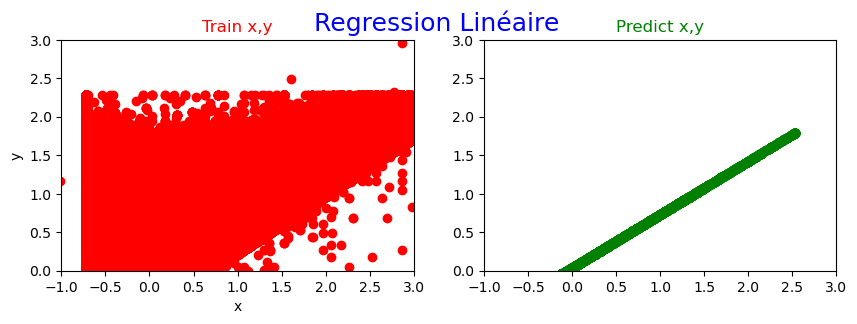

In [40]:
# SCATTER PLOT Variable à prédire / prédite
x=xCentreReduit
y=yCentreReduit

plt.rcdefaults()
plt.rcParams['axes.grid'] = False
plt.rcParams["figure.figsize"] = (10,3)

fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(10,3))
plt.suptitle('Regression Linéaire', fontsize=18,color="blue")

axes=axes.flatten()

#axes[0].scatter(xCentreReduit,yCentreReduit,color="red")
axes[0].scatter(x,y,color="red")
axes[0].set_title("Train x,y",color="red")
axes[0].set_xlim([-1, 3])
axes[0].set_ylim([0, 3])
axes[0].set_xlabel("x")
axes[0].set_ylabel("y")


axes[1].set_xlim([-1, 3])
axes[1].set_ylim([0, 3])
axes[1].scatter(sXPredictCentreReduit,sYPredictCentreReduit,color="green")
axes[1].set_title("Predict x,y",color="green")

#### Imputation des valeurs

In [41]:
# copie par valeur
import copy
dfNumImput=copy.deepcopy(dfNum3)

In [42]:
#tableau de valeurs predites pour la variable "saturated-fat_100g"
aPredicted=lm.predict(dfNum3[mask][xName].values.reshape(-1,1))

# index of non-null numbers
idx = dfNum3[mask].index

# make pandas series with idx and result
sPredicted = pd.Series(aPredicted[:,0], idx)
sPredicted.describe()
dfPredicted=pd.DataFrame(sPredicted)
dfPredicted.columns = [yName]
dfPredicted

,carbohydrates_100g
190,60.806653
191,34.891354
234,0.730277
307,8.837470
456,28.585760
...,...
320698,15.281649
320734,1.284615
320740,7.313041
320741,0.730277


In [43]:
# imputation avec les predictions de la régression lineare
dfNumImput.update(dfPredicted)

In [44]:
dfNumImput[yName]

0           NaN
1         64.29
2         60.71
3         17.86
4         77.14
          ...  
320767      NaN
320768     0.00
320769      NaN
320770      NaN
320771     0.00
Name: carbohydrates_100g, Length: 320772, dtype: float64

#### Comparaison avant/après imputation

In [45]:
# variable imputée
yName="carbohydrates_100g"

In [46]:
# comparaison avant/après
print(f"variable '{yName}' - Nb NA avant: {np.round(dfNum[yName].isna().sum()/320772*100,2)}% -> Nb NA après:{np.round(dfNumImput[yName].isna().sum()/320772*100,2)}%")

variable 'carbohydrates_100g' - Nb NA avant: 24.06% -> Nb NA après:18.58%


In [47]:
print(f"variable '{yName} - Original")
dfNum[yName].describe()

variable 'carbohydrates_100g - Original


count    243588.000000
mean         32.059124
std          29.145949
min           0.000000
25%           6.000000
50%          20.600000
75%          58.330000
max         136.000000
Name: carbohydrates_100g, dtype: float64

In [48]:
print(f"variable '{yName} - Imputé")
dfNumImput[yName].describe()

variable 'carbohydrates_100g - Imputé


count    261167.000000
mean         30.622098
std          29.834796
min           0.000000
25%           5.000000
50%          18.600000
75%          56.820000
max        2916.670000
Name: carbohydrates_100g, dtype: float64

In [49]:
mask=maskOutliers(dfNumImput[yName])
dfNumImput.loc[mask,yName]=0

Text(0.5, 1.0, 'Après')

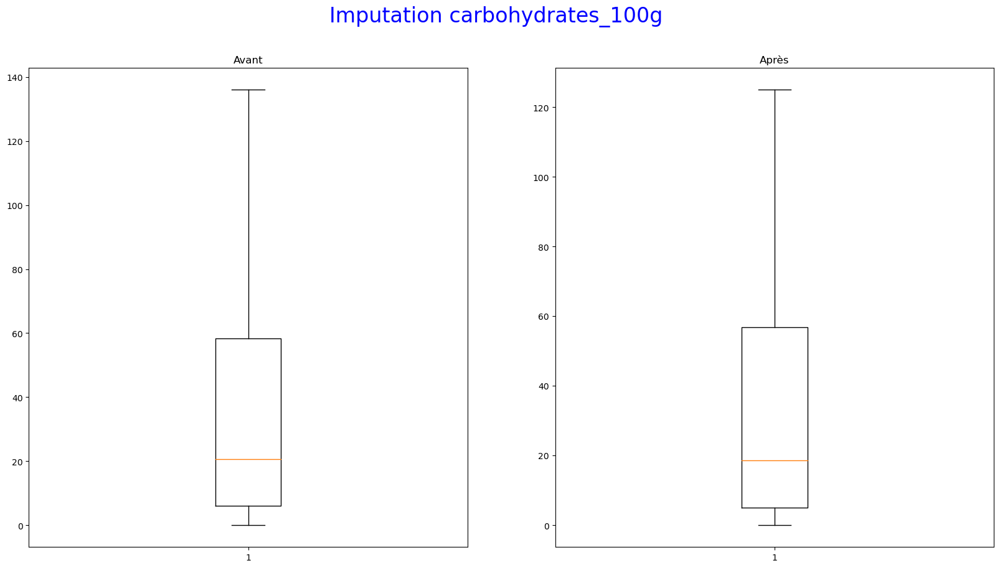

In [50]:
# boxplot de la variable avant / après imputation
plt.rcdefaults()

fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(20,10))

plt.suptitle('Imputation '+yName, fontsize=24,color="blue")


axes=axes.flatten()

axes[0].boxplot(dfNum[[yName]].dropna())
axes[0].set_title("Avant")

axes[1].boxplot(dfNumImput[[yName]].dropna())
axes[1].set_title("Après")

#dfNumImput[['carbohydrates_100g']].dropna()

In [51]:
import copy
colonnesNum3=copy.deepcopy(colonnesNum3)

In [52]:
colonnesNum4=list(set(colonnesNum3) - set(['fiber_100g','vitamin-a_100g','vitamin-c_100g','salt_100g','iron_100g','calcium_100g']))

## <font color=#FB5607>Variables qualitatives</font>

In [53]:
dfQual=dfNA80[colonnesQual]
dfQual.shape

(320772, 32)

In [54]:
dfQual.describe()

,packaging,categories,quantity,countries_fr,categories_tags,categories_fr,states,countries_tags,brands_tags,last_modified_datetime,...,packaging_tags,additives,creator,image_small_url,product_name,ingredients_text,code,states_tags,last_modified_t,additives_fr
count,78960,84410,104819,320492,84389,84411,320726,320492,292352,320772,...,78961,248905,320770,75836,303010,248962,320749,320726,320772,154680
unique,14547,36982,13826,722,21142,21152,1021,725,50253,180495,...,12064,196069,3535,75836,221347,205520,320749,1021,180495,41537
top,Carton,"Snacks sucrés,Biscuits et gâteaux,Biscuits",500 g,États-Unis,"en:sugary-snacks,en:biscuits-and-cakes,en:bisc...","Snacks sucrés,Biscuits et gâteaux,Biscuits","en:to-be-completed, en:nutrition-facts-complet...",en:united-states,carrefour,2015-08-09T17:35:42Z,...,"sachet,plastique",[ extra-virgin-olive-oil -> en:extra-virgin-o...,usda-ndb-import,http://fr.openfoodfacts.org/images/products/93...,Ice Cream,"Carbonated water, natural flavor.",0815369012843,"en:to-be-completed,en:nutrition-facts-complete...",1439141742,E322 - Lécithines
freq,2153,301,4669,172998,802,802,168905,172998,3149,33,...,3959,397,169868,1,410,222,1,168905,33,8264


### Diagrammes a barres

In [55]:
# fonction mode qui agrege les variables qui sont sous un seuil 'threshold'(pour les très gros dataframe qui ont du mal à plotter)
def summarizeFrequenciesDf(df,threshold):
    dfFrequencies=df.value_counts(normalize=True) # frequence normalisée des valeurs de chaque variable
    mask = dfFrequencies>threshold # masque sur les fréquences > seuil
    dfTail= dfFrequencies.loc[~mask].sum()
    dfFrequencies=dfFrequencies.loc[mask] # filtre sur les fréquences < seuil
    dfFrequencies['Autres']=dfTail # ajout des fréquences > seuil agregées dans la categorie 'Autre'
    return pd.DataFrame(dfFrequencies)

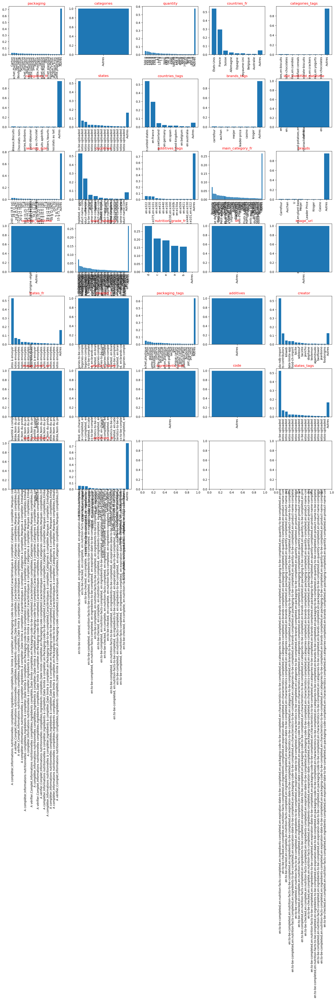

In [56]:
plt.rcParams["figure.figsize"] = (100,40)

fig, axes = plt.subplots(nrows=7, ncols=5,figsize=(20,30))



# axes est un tableau à 2 dimensions: lignes, colonnes
# pour parcourir les subplot, il faut réduire axes à une dimension avec flatten
axes=axes.flatten()


# espace vertical entre les rangées de sous graphiques
plt.subplots_adjust(hspace=.5)
# initialisation du compteur
i=0

# for x in ['categories','packaging_tags','states']: # debug
# boucle de dessins des variables qualitatives
for x in dfQual:
    # passe les labels sur l'axe des x en arriere plan
    axes[i].xaxis.label.set_visible(False)
    
    dfCurrent=summarizeFrequenciesDf(dfQual[x],0.005)
    #print(f"[{i}]-{x}-{(len(x)/10)}") # debug

    axes[i].bar(dfCurrent[x].index,dfCurrent[x])
    axes[i].tick_params(axis='x', rotation=90)
    axes[i].set_title(x,color='red')

    i=i+1

#fig.suptitle("Données Qualitatives - Mode", fontsize=14)
plt.show()

On remarque les variables qualitatives dont les fréquences de valeurs < 5% sont majoritaires (catégorie Autre prédominante).\
Cela signifierait que ces variables n'ont pas de catégories de valeurs plus importantes que les autres.

De plus, ces variables n'apportent pas d'information sur la composition des aliments.\
=> On exclue donc les variables suivantes: last_modified_t, code, image_url, image_small_url, last_modified_date_time, ingredient_text, url, created_t, created_datetime

In [57]:
dfQualLight=dfQual.drop(['packaging','packaging_tags','last_modified_t', 'code', 'image_url', 'image_small_url', 'last_modified_datetime', 'ingredients_text', 'url', 'created_t', 'created_datetime'],axis=1)

# liste des variables qualitatives que l'on garde
colonnesQual=list(dfQualLight.columns.values)

In [58]:
dfNA80[colonnesQual]

,categories,quantity,countries_fr,categories_tags,categories_fr,states,countries_tags,brands_tags,serving_size,countries,...,main_category_fr,brands,main_category,nutrition_grade_fr,states_fr,additives,creator,product_name,states_tags,additives_fr
0,NaN,1kg,France,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-c...",en:france,ferme-t-y-r-nao,NaN,en:FR,...,NaN,Ferme t'y R'nao,NaN,NaN,"A compléter,Informations nutritionnelles à com...",NaN,openfoodfacts-contributors,Farine de blé noir,"en:to-be-completed,en:nutrition-facts-to-be-co...",NaN
1,NaN,NaN,États-Unis,NaN,NaN,"en:to-be-completed, en:nutrition-facts-complet...",en:united-states,NaN,28 g (1 ONZ),US,...,NaN,NaN,NaN,d,"A compléter,Informations nutritionnelles compl...",[ bananas -> en:bananas ] [ vegetable-oil -...,usda-ndb-import,Banana Chips Sweetened (Whole),"en:to-be-completed,en:nutrition-facts-complete...",NaN
2,NaN,NaN,États-Unis,NaN,NaN,"en:to-be-completed, en:nutrition-facts-complet...",en:united-states,torn-glasser,28 g (0.25 cup),US,...,NaN,Torn & Glasser,NaN,b,"A compléter,Informations nutritionnelles compl...",[ peanuts -> en:peanuts ] [ wheat-flour -> ...,usda-ndb-import,Peanuts,"en:to-be-completed,en:nutrition-facts-complete...",NaN
3,NaN,NaN,États-Unis,NaN,NaN,"en:to-be-completed, en:nutrition-facts-complet...",en:united-states,grizzlies,28 g (0.25 cup),US,...,NaN,Grizzlies,NaN,d,"A compléter,Informations nutritionnelles compl...",[ organic-hazelnuts -> en:organic-hazelnuts ...,usda-ndb-import,Organic Salted Nut Mix,"en:to-be-completed,en:nutrition-facts-complete...",NaN
4,NaN,NaN,États-Unis,NaN,NaN,"en:to-be-completed, en:nutrition-facts-complet...",en:united-states,bob-s-red-mill,35 g (0.25 cup),US,...,NaN,Bob's Red Mill,NaN,NaN,"A compléter,Informations nutritionnelles compl...",[ organic-polenta -> en:organic-polenta ] [...,usda-ndb-import,Organic Polenta,"en:to-be-completed,en:nutrition-facts-complete...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320767,NaN,1,Roumanie,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-c...",en:romania,panzani,NaN,en:RO,...,NaN,Panzani,NaN,NaN,"A compléter,Informations nutritionnelles à com...",NaN,openfoodfacts-contributors,Tomato & ricotta,"en:to-be-completed,en:nutrition-facts-to-be-co...",NaN
320768,NaN,NaN,États-Unis,NaN,NaN,"en:to-be-completed, en:nutrition-facts-complet...",en:united-states,trader-joe-s,20 g (0.7 oz),US,...,NaN,Trader Joe's,NaN,b,"A compléter,Informations nutritionnelles compl...",[ organic-peppermint -> en:organic-peppermint...,usda-ndb-import,"Mint Melange Tea A Blend Of Peppermint, Lemon ...","en:to-be-completed,en:nutrition-facts-complete...",NaN
320769,Potato chips,50 g,Chine,"en:salty-snacks,en:appetizers,en:chips-and-fri...","Snacks salés,Apéritif,Chips et frites,Chips,Ch...","en:to-be-completed, en:nutrition-facts-to-be-c...",en:china,乐吧,NaN,China,...,Chips et frites,乐吧,en:chips-and-fries,NaN,"A compléter,Informations nutritionnelles à com...",NaN,tomato,乐吧泡菜味薯片,"en:to-be-completed,en:nutrition-facts-to-be-co...",NaN
320770,NaN,67g,France,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-c...",en:france,knorr,NaN,en:FR,...,NaN,Knorr,NaN,NaN,"A compléter,Informations nutritionnelles à com...",NaN,openfoodfacts-contributors,Tomates aux Vermicelles,"en:to-be-completed,en:nutrition-facts-to-be-co...",NaN


## <font color=#FB5607>Bilan du nettoyage</font>

**Dataframe initial**

In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Columns: 162 entries, code to water-hardness_100g
dtypes: float64(106), object(56)
memory usage: 396.5+ MB


**Dataframe nettoyé**

In [60]:
colonnesNum5=list(set(colonnesNum4) - set(['nutrition_grade_fr'])) # on supprime la variable nutrition_grade_fr avant d'écrirer le fichier clean
# dataframe nettoyé
dfNA80[colonnesQual+colonnesNum5].info(verbose=None)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 30 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   categories               84410 non-null   object 
 1   quantity                 104819 non-null  object 
 2   countries_fr             320492 non-null  object 
 3   categories_tags          84389 non-null   object 
 4   categories_fr            84411 non-null   object 
 5   states                   320726 non-null  object 
 6   countries_tags           320492 non-null  object 
 7   brands_tags              292352 non-null  object 
 8   serving_size             211331 non-null  object 
 9   countries                320492 non-null  object 
 10  additives_tags           154680 non-null  object 
 11  main_category_fr         84366 non-null   object 
 12  brands                   292360 non-null  object 
 13  main_category            84366 non-null   object 
 14  nutr

## <font color=#FB5607>Ecriture fichier CSV</font>

In [61]:
# sortie fichier csv 'products_clean.csv'
dfNA80[colonnesQual+colonnesNum5].to_csv('products_clean.csv',index=False)
print(f"Elapsed: {time.time() - now}")

Elapsed: 86.03734612464905
